In [ ]:
#@title Create environment
# Conda is uninstalled every time you rehash yuor environment... 
#!conda --version
#If !conda --version returns no results, install conda with :
!pip install -q condacolab
import condacolab
condacolab.install()

⏬ Downloading https://github.com/jaimergp/miniforge/releases/latest/download/Mambaforge-colab-Linux-x86_64.sh...
📦 Installing...
📌 Adjusting configuration...
🩹 Patching environment...
⏲ Done in 0:00:20
🔁 Restarting kernel...


In [ ]:
!pip install pyscf
!pip install ase
!pip install py3dmol

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.2/38.2 MB 43.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.5/34.5 MB 46.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 95.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 113.5 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 25.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.2/9.2 MB 109.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.3/98.3 kB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 94.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.7/42.7 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 247.7/247.7 kB 25.3 MB/s eta 0:00:00


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Enhancement factors

In [ ]:
def lda(s):
    eq = 1.0
    return eq

def pbe(s,k=0.804,mu=0.21951):
    eq = 1 + k - (k/(1 + (mu*(s**2)/k)))
    return eq

def pbesol(s,k=0.804,mu=0.1235):
    eq = 1 + k - (k/(1 + (mu*(s**2)/k)))
    return eq

def rpbe(s,k=0.804,mu=0.2195):
    eq = 1 + k * (1 - np.exp(-mu*(s**2)/k))
    return eq

def optb88(s,mu=0.22):
    c = 2**(4/3) * (3 * pi**2)**(1/3)
    b = 9 * mu * (6/pi)**(1/3) / (2 * c)
    eq = 1 + ( mu * s**2 / (1 + b * s * asinh(c*s)) )
    return eq

def optpbe(s,k=1.04804,mu=0.175519):
    eq = 1 + k - (k/(1 + (mu*(s**2)/k)))
    return eq

def vdw_df_cx(s,z_ab=-0.8491,a=0.02178,b=1.15):
    mu = -z_ab/9
    a_df2 = 0.0864
    b_df2 = 14.0
    c_df2 = 0.2
    fx_s_df2 = (1 + a_df2*(s**2) + b_df2*(s**4) + c_df2*(s**6))**(1/15)
    eq = (1/(1 + a*(s**6))) * (1 + mu*(s**2)) + ((a * (s**6))/(b + a*(s**6))) * fx_s_df2
    return eq

def scan(s,alpha):
    k1 = 0.065
    mu_ak = 10./81.
    b2 = (5913./405000.)**(1/2)
    b1 = (511./13500.)/(2*b2)
    b3 = 0.5
    b4 = (mu_ak**2)/k1 - 1606./18225. - b1**2
        
    if alpha == 0:
        if s == 0:
            return 1.174 * 1
        else:
            return 1.174 * (1 - exp(-4.9479*s**(-1/2)))
        
    elif alpha == 1:
        x = mu_ak * (s)**2 * (1 + (b4*(s)**2/mu_ak)*exp(-abs(b4)*(s)**(2) / mu_ak)) + (b1*(s)**2 + b2*(1-alpha)*exp(-b3*(1-alpha)**(2)))**(2)
        gx = 1 - exp(-4.9479*s**(-1/2))
        h1 = 1 + k1 - k1/(1 + x/k1)
        return gx * h1
    
    else:
        x = mu_ak * s**2 * (1 + (b4*s**2/mu_ak)*exp(-abs(b4)*s**2/mu_ak)) + (b1*s**2 + b2*(1-alpha)*exp(-b3*(1-alpha)**2))**2
        h1 = 1 + k1 - k1/(1+x/k1)
        h0 = 1.174
        if s == 0:
            gx =  1
        else:
            gx = 1 - exp(-4.9479*s**(-1/2))
        
        c1 = 0.667
        c2 = 0.8
        dx = 1.24
        if alpha > 200:
            fx = - dx
        else:
            fx = exp(-c1*alpha/(1-alpha)) - dx*exp(c2/(1-alpha))
        
        return (h1 + fx * (h0 - h1)) * gx

## Plotting

In [ ]:
s = np.linspace(0,8,200)

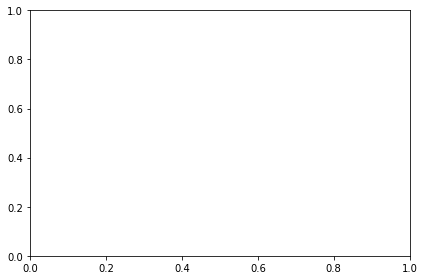

In [ ]:
fig, ax = plt.subplots(1,1, tight_layout=True)

In [ ]:
# aestethics
lw = 1.0
ls = '--'

In [ ]:
# LDA is a straight line
ax.axhline(1.0, label='LDA', lw=lw, color='black')

In [ ]:
ax.plot(s, pbe(s), '-', label='PBE', lw=lw, color='blue')
ax.plot(s, rpbe(s), '-', label='RPBE', lw=lw, color='orange')
ax.plot(s, pbesol(s), '-', label='PBEsol', lw=lw, color='green')

In [ ]:
ax.legend()

In [ ]:
ax.set_xlabel('s')

ax.set_ylabel(r'$F_x(s)$')

Text(3.200000000000003, 0.5, '$F_x(s)$')

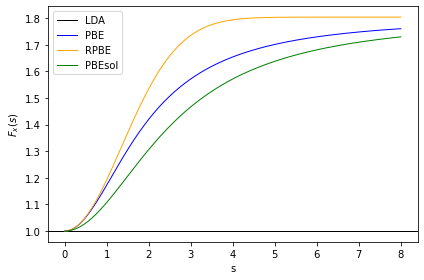

In [ ]:
fig

# Compute energy and charge-density of the carbon atom.

In [ ]:
import pyscf.pbc.tools.pyscf_ase as pyscf_ase
import pyscf.pbc.gto as pbcgto
import pyscf.pbc.dft as pbcdft
import matplotlib.pyplot as plt
from ase.lattice import bulk
from pyscf.tools import chgcar, cubegen


c= bulk('C','fcc',a=6.)

cell = pbcgto.Cell()
cell.atom = pyscf_ase.ase_atoms_to_pyscf(c)
cell.a = c.cell

cell.basis = 'gth-szv'
cell.pseudo = 'gth-pade'
cell.verbose = 5
cell.build(None,None)

#xc = 'pbe,pbe'
xc = 'lda,vwn'
mf = pbcdft.RKS(cell,xc=xc)
print(mf.kernel())




******** <class 'pyscf.pbc.dft.rks.RKS'> ********
method = RKS-KohnShamDFT
initial guess = minao
damping factor = 0
level_shift factor = 0
DIIS = <class 'pyscf.scf.diis.CDIIS'>
diis_start_cycle = 1
diis_space = 8
SCF conv_tol = 1e-07
SCF conv_tol_grad = None
SCF max_cycles = 50
direct_scf = False
chkfile to save SCF result = /content/tmp0o03u4gc


<ipython-input-1-7566136a2671>:9: UserWarning: Use ase.build.bulk() instead
  c= bulk('C','fcc',a=6.)


max_memory 4000 MB (current use 138 MB)
******** PBC SCF flags ********
kpt = [0. 0. 0.]
Exchange divergence treatment (exxdiv) = ewald
Ewald components = 5.62797686712786e-139, -1.24627756066798, 1.04409385007494
    madelung (= occupied orbital energy shift) = 0.4043674211860817
    Total energy shift due to Ewald probe charge = -1/2 * Nelec*madelung = -0.808734842372
DF object = <pyscf.pbc.df.fft.FFTDF object at 0x7fb2148f8fd0>
XC functionals = lda,vwn
small_rho_cutoff = 1e-07
Uniform grid, mesh = [48 48 48]
Set gradient conv threshold to 0.000316228
Big error detected in the electron number of initial guess density matrix (Ne/cell = 3.92058)!
  This can cause huge error in Fock matrix and lead to instability in SCF for low-dimensional systems.
  DM is normalized wrt the number of electrons 4
    CPU time for setting up grids      0.18 sec, wall time      0.14 sec
nelec by numeric integration = 3.999999999997862
    CPU time for vxc      2.03 sec, wall time      2.17 sec
Building PB

/usr/local/lib/python3.8/site-packages/pyscf/pbc/gto/cell.py:242: UserWarning: Function cell.dumps drops attribute a because it is not JSON-serializable
  warnings.warn(msg)


nelec by numeric integration = 3.9999999999980087
    CPU time for vxc      1.96 sec, wall time      2.02 sec
    CPU time for vj and vk      0.01 sec, wall time      0.01 sec
Ewald components = 9.00476298740458e-138, -19.9404409706877, 16.7055016011991
E1 = -2.221751424632026  Ecoul = 1.612976509506342  Exc = -1.4560912900919487
cycle= 1 E= -5.29980557470629  delta_E= 0.0777  |g|= 0.000189  |ddm|= 1.81
    CPU time for cycle= 1      2.05 sec, wall time      2.10 sec

WARN: HOMO -0.0858958996726252 == LUMO -0.0857792858909351

  mo_energy =
[-0.40374739 -0.0858959  -0.08577929 -0.04587898]
nelec by numeric integration = 3.999999999998013
    CPU time for vxc      1.99 sec, wall time      1.83 sec
    CPU time for vj and vk      0.00 sec, wall time      0.01 sec
Ewald components = 9.00476298740458e-138, -19.9404409706877, 16.7055016011991
E1 = -2.2217514246316403  Ecoul = 1.6129782189070156  Exc = -1.4560947077447044
cycle= 2 E= -5.29980728295798  delta_E= -1.71e-06  |g|= 0.000194  |ddm

## Save charge density to file.
We save the charge density in two different file formats (the most common one used in the quantum chemistry comunity) since different codes and may functions require one of these formats.

In [ ]:
%%capture
chgcar.density(cell, 'CHGCAR', mf.make_rdm1())
cubegen.density(cell, "Dens.cube", mf.make_rdm1())

`py3Dmol` can be used to visulize isosurfaces of both orbitals and electron density and requires the `cube` format.

In [ ]:
import py3Dmol

vol_data=open("/content/Dens.cube", "r").read() 

v = py3Dmol.view()
#v.addVolumetricData(vol_data, "cube", {'isoval': -0.005, 'color': "red", 'opacity': 0.75})
v.addVolumetricData(vol_data, "cube", {'isoval': 0.1, 'color': "blue", 'opacity': 0.75})

v.zoomTo()
v.show()

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Visualizing the reduced gradient
The reduced gradient, $s$ is a key property in the DFT world. It used to define the exchange and correlation energies in the so-called Generalized Gradient Approximations (GGAs). 


The function `get_s` computes $s$ and use the `CHGCAR` file format.

In [ ]:
def get_s(chgcar='CHGCAR'):
    '''
    Function to compute the reduced gradient, s. 
    '''
    from ase.calculators.vasp import VaspChargeDensity
    import numpy as np
    pi=np.pi
    chg = VaspChargeDensity(chgcar)
    abc = np.shape(chg.chg[-1])
    dx = abc[0]/np.shape(chg.chg[0])[0]
    dy = abc[1]/np.shape(chg.chg[0])[1]
    dz = abc[2]/np.shape(chg.chg[0])[2]
    v_chg_gr = np.gradient(chg.chg[0],dx,dy,dz)
    chg_grad = np.sqrt( np.square(v_chg_gr[0]) + np.square(v_chg_gr[1]) + np.square(v_chg_gr[2]) )
    s = chg_grad / (2 * (3.* pi**2 * chg.chg[0])**1./3 * chg.chg[0] )
    return s

We can look at the distribution of $s$-values in our system by plotting a histogram.

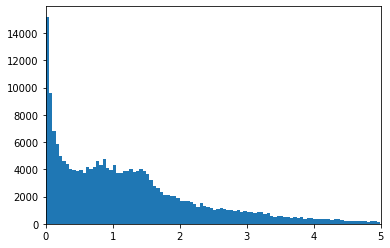

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
s=get_s()
data=s.flatten()
mask = data < 5.0

plt.xlim(0,5)
#_=plt.hist(data[mask],bins=100,log=True)
_=plt.hist(data[mask],bins=100,log=False)

In [ ]:
import pandas as pd
E_vs_a=pd.DataFrame()

In [ ]:
%%capture --no-stderr
import pyscf.pbc.tools.pyscf_ase as pyscf_ase
import pyscf.pbc.gto as pbcgto
import pyscf.pbc.dft as pbcdft
import matplotlib.pyplot as plt
from ase.build import bulk
from pyscf.tools import chgcar, cubegen
import numpy as np

# x=0 corresponds to LDA, and x=1 to PBE
for x in [0.0, 1.0]:
  xc = f'{x} * pbe + {1-x}*lda, {x} * pbe + {1-x}*vwn'

  #CALCULATE THE ATOM
  c= bulk('C','fcc',a=6.)
  cell = pbcgto.Cell()
  cell.atom = pyscf_ase.ase_atoms_to_pyscf(c)
  cell.a = c.cell
  cell.basis = 'gth-TZV2P'
  cell.pseudo = 'gth-PBE'
  cell.verbose = 0
  cell.build(None,None)
  mf = pbcdft.RKS(cell,xc=xc,kpt=[0,0,0])
  E0=mf.kernel()
  ###############


  a0_exp=3.5668   #Lattice parameter
  Ecoh_exp= 7.346 #Cohesive energy eV/atom
  E_vs_a['a'] = a_list = np.arange(3.40,3.60,0.02)
  E_list=[]

  for a in a_list:
    c  = bulk('C','diamond',a=a)
    cell = pbcgto.Cell()
    cell.atom = pyscf_ase.ase_atoms_to_pyscf(c)
    cell.a = c.cell
    cell.basis = 'gth-TZV2P' #You can explore various basis-set with varying quality.
    cell.pseudo = 'gth-PBE'
    #cell.basis='aug-TZVP-GTH'
    cell.exp_to_discard=0.1
    cell.verbose = 0
    cell.build(None,None)
    
    mf = pbcdft.RKS(cell,xc=xc,kpt=[12,12,12])
    E=mf.kernel()

    E_list.append(27.211399*( E-2*E0) /2. )
    print("Cellparameter = ",a," Å, Energy Coh.: =",27.211399*(E-2*E0)/2.," eV/atom. XC: ",xc)

  E_vs_a[f"E_{x}"]=E_list



WARNING!
  Very diffused basis functions are found in the basis set. They may lead to severe
  linear dependence and numerical instability.  You can set  cell.exp_to_discard=0.1
  to remove the diffused Gaussians whose exponents are less than 0.1.

/usr/local/lib/python3.8/site-packages/pyscf/pbc/gto/cell.py:242: UserWarning: Function cell.dumps drops attribute a because it is not JSON-serializable
  warnings.warn(msg)
WARNING!
  Very diffused basis functions are found in the basis set. They may lead to severe
  linear dependence and numerical instability.  You can set  cell.exp_to_discard=0.1
  to remove the diffused Gaussians whose exponents are less than 0.1.



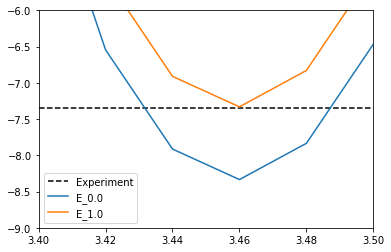

In [ ]:
a_list=E_vs_a['a']
plt.xlim(3.4,3.5)
plt.ylim(-9,-6)
plt.plot([min(a_list),max(a_list)],[-Ecoh_exp,-Ecoh_exp],'--',color='black',label='Experiment')
for key in E_vs_a.keys():
  if 'E' in key:
    plt.plot(E_vs_a['a'],E_vs_a[key],label=key)
plt.legend()

